In [1]:
%cd ..

/Users/gimli/projects/igre


In [2]:
import modalities.dir_dataset as dataset
import cv2
import matplotlib.pyplot as plt
import src.models.ig
import src.data.rescale_range as rr
import numpy as np
import modalities.mimshow as mplot
import modalities.stats as stats
from skimage import color as convertor
import plotly.graph_objects as go
np.set_printoptions(suppress=True)

# Suicide of Saul

Visualization of RGB color space

In [3]:
# Load visible image
vis_rgb = np.asarray(cv2.cvtColor(
                cv2.imread("/Users/gimli/Qsync/datasets/Suicide_Of_Saul/outputs/visw.png"),cv2.COLOR_BGR2RGB)
      ).astype(np.float32)/255.0
vis_Lab = convertor.rgb2lab(vis_rgb)

In [4]:
# Load pantone La*b* coverage
import pandas
coated = pandas.read_csv(open('/Users/gimli/represent/datastore/pantone_colors.csv', 'rt'))
pantones_Lab = {}
pantones_rgb = {}
for row in coated.to_numpy():
    pantones_Lab[row[3]] = np.array([row[4], row[5], row[6]])
    pantones_rgb[row[3]] = np.array([row[8], row[9], row[10]])

In [5]:
# Prepare Lab coordinates for scatter plot
vis = np.stack([vis_Lab[:,:,0], vis_Lab[:,:,1], vis_Lab[:,:,2]], axis=2)
# reduction of colors for scatter visualization
lab_clusters, clusters_size = np.unique((vis).astype("int").reshape(557*933,3), axis=0, return_counts=True)

## Visualization
Shape formed from lines represents the current ability of Pantone colors to cover Lab color space (what we are able to print nowadays). In this context are put the La\*b\* coordinates of pixels from Suicide of Saul.

Observations:
- the original full color space is compressed to the white/yellowish central point
- this compression (aka fading) is in this case crucial

In [6]:
# Visualize 
L = [pantones_Lab[color_name][0] for color_name in pantones_Lab]
a = [pantones_Lab[color_name][1] for color_name in pantones_Lab]
b = [pantones_Lab[color_name][2] for color_name in pantones_Lab]
c = [np.array(pantones_rgb[color_name], dtype="float")/255.0 for color_name in pantones_rgb]
fig= go.Figure(data=[go.Scatter3d(x=a, 
                                  y=b, 
                                  z=L, 
                                  mode='lines',
                                  opacity = 0.3,
                                  line=dict( 
                                      color=c,
                                      width=2
                                  ),
                                  name="pantone"
                                 ),
                    go.Scatter3d(x=lab_clusters[:,1], 
                                 y=lab_clusters[:,2], 
                                 z=lab_clusters[:,0], 
                                 mode='markers',
                                 opacity = 0.2,
                                 marker=dict( 
                                     color=[f"rgb{tuple(convertor.lab2rgb([[color]])[0,0])}" 
                                            for color in lab_clusters.astype("float")],                                     
                                     size=3, # np.power(clusters_size,3/5),
                                     line_width=0
                                  ),
                                 name="saul colormap"
                                 )])
                     
fig.update_layout(autosize=False, width=1000, height=800, margin=dict(l=0, r=0, b=0, t=0))
fig.show()

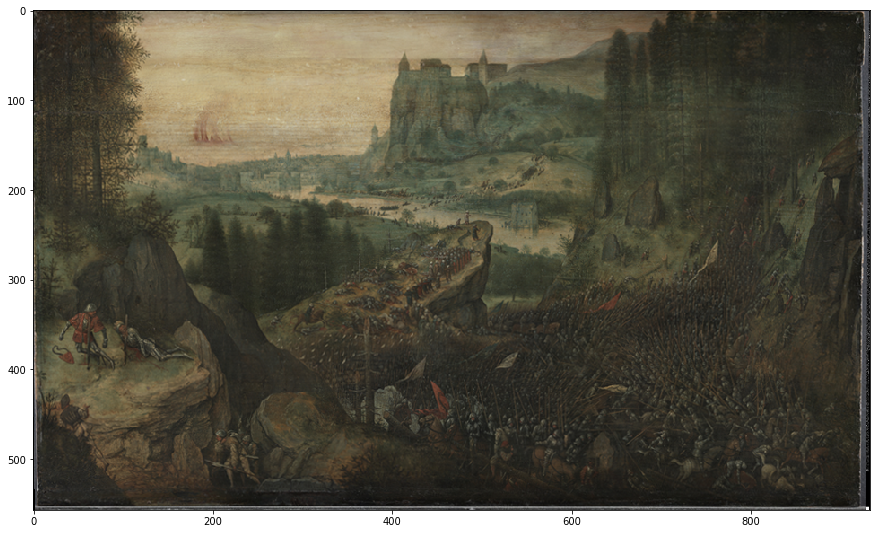

In [7]:
plt.figure(figsize=(15,10))
plt.imshow(vis_rgb)
plt.show()

For comparison of colorspace coverage we take more "shiny painting"

# Girl with pearl earing

The same visualization follows:
- lines represent Pantone coverage of colorspace (by contemporary paint matterials)
- circles represents pixel colors in the painting

In [8]:
# Load visible image
vis_rgb = np.asarray(cv2.cvtColor(
                cv2.imread("/Users/gimli/Qsync/datasets/Girl with the Pearl Earring/vis.jpg"),cv2.COLOR_BGR2RGB)
      ).astype(np.float32)/255.0
vis_Lab = convertor.rgb2lab(vis_rgb)

# Prepare Lab coordinates for scatter plot
vis = np.stack([vis_Lab[:,:,0], vis_Lab[:,:,1], vis_Lab[:,:,2]], axis=2)
# reduction of colors for scatter visualization
lab_clusters, clusters_size = np.unique((vis).astype("int").reshape(vis.shape[0]*vis.shape[1],3), axis=0, return_counts=True)

# Visualize 
L = [pantones_Lab[color_name][0] for color_name in pantones_Lab]
a = [pantones_Lab[color_name][1] for color_name in pantones_Lab]
b = [pantones_Lab[color_name][2] for color_name in pantones_Lab]
c = [np.array(pantones_rgb[color_name], dtype="float")/255.0 for color_name in pantones_rgb]
fig= go.Figure(data=[go.Scatter3d(x=a, 
                                  y=b, 
                                  z=L, 
                                  mode='lines',
                                  opacity = 0.3,
                                  line=dict( 
                                      color=c,
                                      width=2
                                  ),
                                  name="pantone"
                                 ),
                    go.Scatter3d(x=lab_clusters[:,1], 
                                 y=lab_clusters[:,2], 
                                 z=lab_clusters[:,0], 
                                 mode='markers',
                                 opacity = 0.2,
                                 marker=dict( 
                                     color=[f"rgb({', '.join([format(f, 'f') for f in tuple(convertor.lab2rgb([[color]])[0,0])])})" 
                                        for color in lab_clusters.astype("float")
                                     ],                                     
                                     size=3, # np.power(clusters_size,3/5),
                                     line_width=0
                                  ),
                                 name="girl with pearl earring colormap"
                                 )])
                     
fig.update_layout(autosize=False, width=1000, height=800, margin=dict(l=0, r=0, b=0, t=0))
fig.show()

## Color reconstruction

To be able to reconstruct colors from XRF bands it is necessary to have relevant spectral endmembers.
For this prupose we suggest creation of samples with pure historical colors which will be used as our endmembers.

### Mixing model
There is also necessary to take into account some mixing model for XRF spectra. We expect:
1. Linear combination of pigments => same linear combination of captured XRF spectra as an output
2. XYZ model for mixing colors will be sufficient

Assumptions should be evaluated as well. We suggest creation of mixed color samples for which La\*b\* coordinates will be measured 

# Color import from the Girl to the Saul

In [23]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [30]:
import modalities.dir_dataset as dataset
import os

In [33]:
saul, saul_metadata = dataset.load_all_images("/Users/gimli/Qsync/datasets/Suicide_Of_Saul/total_per_tif")
girl, girl_metadata = dataset.load_all_images("/Users/gimli/Qsync/datasets/Girl with the Pearl Earring/MA-XRF")

In [53]:
vis_reg = cv2.cvtColor(cv2.imread("/Users/gimli/Qsync/datasets/Girl with the Pearl Earring/vis-reg.png"), cv2.COLOR_BGR2LAB)[:,:1010,:]

### Quantization of colors in several steps
- compute minimia and maxima for dimensions L, a*, b*
- rescale values to [0,9] for each band and round
- rescale values back

In [55]:
mn = [0,0,0]
mx = [0,0,0]
rg = [0,0,0]
for i in [0, 1, 2]:
    mn[i] = np.min(vis_reg[:,:,i])
    mx[i] = np.max(vis_reg[:,:,i])
    rg[i] = mx[i] - mn[i]

In [91]:
gvis = np.zeros(vis_reg.shape,dtype=int)

In [101]:
for i in [0, 1, 2]:
    gvis[:,:,i] = (((vis_reg[:,:,i].astype(dtype=float) - mn[i])/(mx[i] - mn[i])
                            * 9).round().astype(dtype=int) / 9.0 * (mx[i] - mn[i]) + mn[i]).astype(int)

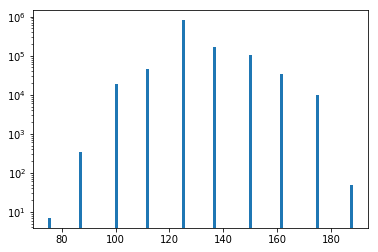

In [103]:
plt.hist(gvis[:,:,2].reshape(1183*1010,1), bins=100)
plt.yscale("log")
plt.show()

In [183]:
Lvals = set(gvis[:,:,0].reshape(1183*1010,).tolist())

In [184]:
avals = set(gvis[:,:,1].reshape(1183*1010,).tolist())

In [185]:
bvals = set(gvis[:,:,2].reshape(1183*1010,).tolist())

In [177]:
import pandas as pd

### Analysis of XRF based on color
- take all pixels with the same color and make hist and boxplot of XRF dimensions

In [188]:
representatives = np.zeros((10,10,10,22))
for lidx, L in enumerate(Lvals):
    for aidx, a in enumerate(avals):
        for bidx, b in enumerate(bvals):
            coords = (gvis[:,:,0] == L) & (gvis[:,:,1] == a) & (gvis[:,:,2] == b)
            vec = pd.DataFrame(girl[0][coords],columns=np.arange(22))
            representatives[lidx, aidx, bidx, :] = vec.median()

In [189]:
candidates = representatives.reshape((1000,22))

In [190]:
from scipy.spatial import distance

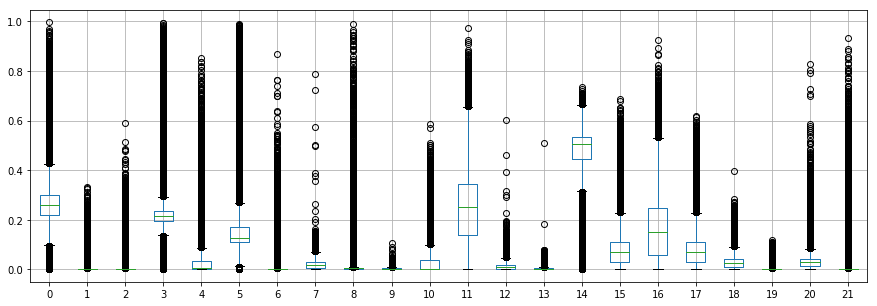

In [176]:
plt.figure(figsize=(15, 5))
ax = plt.subplot()
vec.boxplot(column=np.arange(22).tolist(), ax=ax)

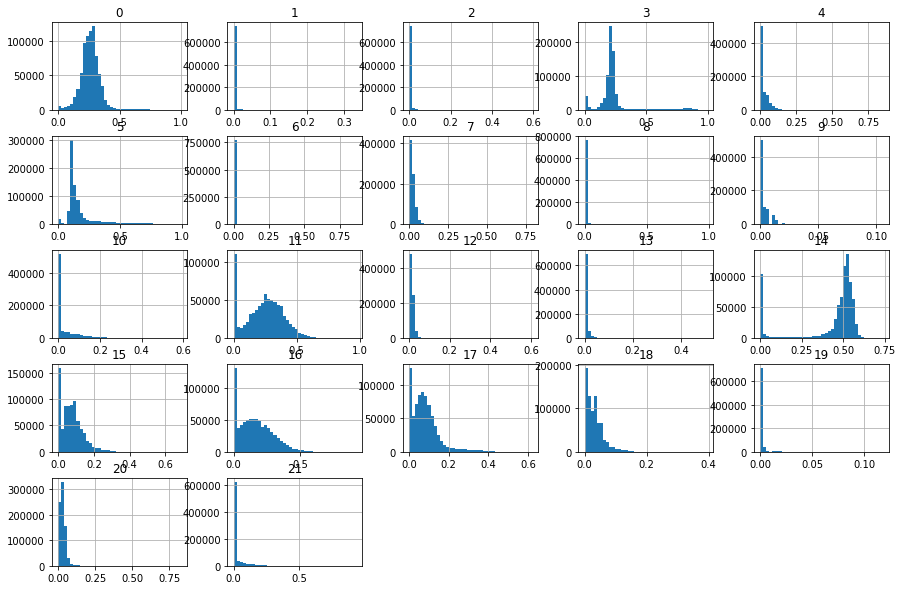

In [168]:
plt.figure(figsize=(15, 10))
ax = plt.subplot()
vec.hist(ax=ax, bins=40)
ax.set_yscale("log")